# Projet 6 : Classez des images à l'aide d'algorithmes de Deep Learning
## Contexte
Afin d'aider une association de protection des animaux, il est demandé de classer les images de la base de données de l'association dans le but de déterminer la race des chiens sur les images

## Démarches
Pour réaliser la demande de l'association nous procédons en plusieurs étapes :
- téléchargement des images
- test des différentes corrections appliquables
- création d'un réseau de neurones simple
- test de transfer learning à partir de différents modèles  
Le modèle le plus performant sera ensuite déployé dans un code afin de faciliter son utilisation.

## Notebook d'exploration

## Modules Python 

In [1]:
import tarfile
import os
import numpy as np
import pandas as pd
import PIL.Image
import cv2 
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from PIL.ImageOps import autocontrast, equalize
from PIL import ImageFilter
import matplotlib.pyplot as plt
import xmltodict
from sklearn.preprocessing import LabelEncoder


In [2]:
DIR = "data/"

## Chargement des données
Les images sont chargées à partir de l'archive téléchargée sur http://vision.stanford.edu/aditya86/ImageNetDogs/  
Un DataFrame est créé comportant le path de l'image, l'image en format PIL et le label 

In [3]:
if tarfile.is_tarfile(DIR+"/images.tar") :
    tar_images = tarfile.open(DIR+"/images.tar", 'r')
else : 
    print("Error : "+DIR+"/images.tar is not a tar file")

In [4]:
DATA = pd.DataFrame(columns=['path', 'labels', 'image'])
for members in tar_images.getmembers() :
    if members.isfile():
        lab = members.name.split('/')[-2].split('-')[-1]
        fname = '.'.join(members.name.split('/')[-1].split('.')[:-1])
        f = tar_images.extractfile(members)
        DATA = DATA.append({'path':members.name, 'fname' : fname, \
                            'labels':lab,'image':PIL.Image.open(f)}, \
                           ignore_index=True)
tar_images.close()
DATA.head()

,path,labels,image,fname
0,Images/n02085620-Chihuahua/n02085620_10621.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_10621
1,Images/n02085620-Chihuahua/n02085620_10976.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_10976
2,Images/n02085620-Chihuahua/n02085620_11238.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11238
3,Images/n02085620-Chihuahua/n02085620_11258.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11258
4,Images/n02085620-Chihuahua/n02085620_11337.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11337


In [5]:
print(f"Nombre d'images dans la base de données : {len(DATA)}")

Nombre d'images dans la base de données : 20580


### Lecture des annotations
Les fichiers d'annotations contiennent des informations sur le format des images et sur la localisation des chiens sur les images.  
Pour le moment nous n'avons pas besoin de la localisation des objets et par conséquent nous ne les conservons pas.

In [9]:
meta_data = pd.DataFrame(columns=['fname', 'width', 'height', 'depth'])
#                                 'segment', 'difficult', 'xmin', 'xmax', 'ymin', 'ymax'])
if tarfile.is_tarfile(DIR+"/annotation.tar") :
    tar_annot = tarfile.open(DIR+"/annotation.tar", 'r')
else : 
    print("Error : "+DIR+"/annotation.tar is not a tar file")

imax = len(tar_annot.getmembers())
for i, members in enumerate(tar_annot.getmembers()) :
    if members.isfile():
        f = tar_annot.extractfile(members)
        meta = xmltodict.parse(f.read())['annotation']
        fname = members.name.split('/')[-1]
        #fname = meta['filename']
        
        if len(DATA[DATA['fname'] == fname ]) != 1 :
            print(f"Error : {fname} is {len(DATA[DATA['fname'] == fname ])} times in the database")
        #tmp = {'fname' : fname, 'segment' : int(meta['segment']), \
        #       'difficult' : int(meta['object']['difficult'])}
        tmp = {'fname' : fname}
        for par in ['width', 'height', 'depth'] :
            tmp[par] = float(meta['size'][par])
        #for par in ['xmin', 'xmax', 'ymin', 'ymax'] :
        #    tmp[par] = int(meta['object']['bndbox'][par])
        meta_data = meta_data.append(tmp, ignore_index=True)
tar_annot.close()

Le DataFrame créé est fusionné avec le DataFrame principal

In [10]:
DATA = pd.merge(DATA, meta_data, on='fname', how="outer")
del meta_data
DATA

,path,labels,image,fname,width,height,depth
0,Images/n02085620-Chihuahua/n02085620_10621.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_10621,500.0,298.0,3.0
1,Images/n02085620-Chihuahua/n02085620_10976.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_10976,322.0,484.0,3.0
2,Images/n02085620-Chihuahua/n02085620_11238.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11238,382.0,384.0,3.0
3,Images/n02085620-Chihuahua/n02085620_11258.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11258,375.0,500.0,3.0
4,Images/n02085620-Chihuahua/n02085620_11337.jpg,Chihuahua,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085620_11337,300.0,225.0,3.0
...,...,...,...,...,...,...,...
20575,Images/n02108915-French_bulldog/n02108915_6142...,French_bulldog,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02108915_6142,500.0,375.0,3.0
20576,Images/n02108915-French_bulldog/n02108915_623.jpg,French_bulldog,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02108915_623,375.0,500.0,3.0
20577,Images/n02108915-French_bulldog/n02108915_9666...,French_bulldog,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02108915_9666,500.0,333.0,3.0
20578,Images/n02108915-French_bulldog/n02108915_971.jpg,French_bulldog,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02108915_971,499.0,500.0,3.0


### lecture du fichier lists
L'archive lists contient la liste de toute les images dans un format Matlab, avec le label correspondant encodé.  
Il contient une séparation d'un jeu d'apprentissage et de test.  
Nous n'utiliserons pas ces informations :
- l'encodage sera réalisé directement à partir des labels déjà créés
- la séparation train et test set sera réalisé également afin de controler l'ensemble des paramètres et de pouvoir créer des jeux de données petits pour le développement

In [25]:
import scipy.io
if tarfile.is_tarfile(DIR+"/lists.tar") :
    tar_lists = tarfile.open(DIR+"/lists.tar", 'r')
else : 
    print("Error : "+DIR+"/lists.tar is not a tar file")
for i, members in enumerate(tar_lists.getmembers()) :
    if members.isfile():
        print(members.name)
        f = tar_lists.extractfile(members)
        print(scipy.io.loadmat(f))


file_list.mat
{'__header__': b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Sun Oct  9 08:29:09 2011', '__version__': '1.0', '__globals__': [], 'file_list': array([[array(['n02085620-Chihuahua/n02085620_10074.jpg'], dtype='<U39')],
       [array(['n02085620-Chihuahua/n02085620_10131.jpg'], dtype='<U39')],
       [array(['n02085620-Chihuahua/n02085620_10621.jpg'], dtype='<U39')],
       ...,
       [array(['n02116738-African_hunting_dog/n02116738_9829.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_9844.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_9924.jpg'], dtype='<U48')]],
      dtype=object), 'annotation_list': array([[array(['n02085620-Chihuahua/n02085620_10074'], dtype='<U35')],
       [array(['n02085620-Chihuahua/n02085620_10131'], dtype='<U35')],
       [array(['n02085620-Chihuahua/n02085620_10621'], dtype='<U35')],
       ...,
       [array(['n02116738-African_hunting_dog/n02116738_9829'], dtype='<U44')],
 

### Lecture du test set (et train set)

Features (train_data.mat, test_data.mat):
 - train_data/test_data
   -- contains the feature matrix after histogram intersection kernel has been applied
 - train_fg_data/test_fg_data
   -- contains the feature matrix before applying the histogram intersection kernel
 - train_info/test_info
   -- contains the labels and ids for the corresponding image in the feature matrix  
   
Ces fichiers ne seront pas utilisés car ils contiennent uniquement des information sur les images contenues dans le train et test set : nous avons décidé de créer nos propres jeux de données

In [16]:
import scipy.io
if os.path.isfile(DIR+"/test_data.mat") :
    test_mat = scipy.io.loadmat(DIR+"/test_data.mat")
else : 
    print("Error : "+DIR+"/test_data.mat is not a tar file")

In [17]:
for key in test_mat :
    print("="*50)
    print(key)
    print("="*50)
    print(test_mat[key])

__header__
b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Wed Mar 28 12:07:09 2012'
__version__
1.0
__globals__
[]
test_info
[[(array([[array(['n02085620-Chihuahua/n02085620_2650.jpg'], dtype='<U38')],
         [array(['n02085620-Chihuahua/n02085620_4919.jpg'], dtype='<U38')],
         [array(['n02085620-Chihuahua/n02085620_1765.jpg'], dtype='<U38')],
         ...,
         [array(['n02116738-African_hunting_dog/n02116738_3635.jpg'], dtype='<U48')],
         [array(['n02116738-African_hunting_dog/n02116738_2988.jpg'], dtype='<U48')],
         [array(['n02116738-African_hunting_dog/n02116738_6330.jpg'], dtype='<U48')]],
        dtype=object), array([[array(['n02085620-Chihuahua/n02085620_2650'], dtype='<U34')],
         [array(['n02085620-Chihuahua/n02085620_4919'], dtype='<U34')],
         [array(['n02085620-Chihuahua/n02085620_1765'], dtype='<U34')],
         ...,
         [array(['n02116738-African_hunting_dog/n02116738_3635'], dtype='<U44')],
         [array(['n02116738-Afric

### Exploration de la taille des images

width : Valeur moyenne = 442.5318756073858
height : Valeur moyenne = 385.8612244897959
depth : Valeur moyenne = 3.0


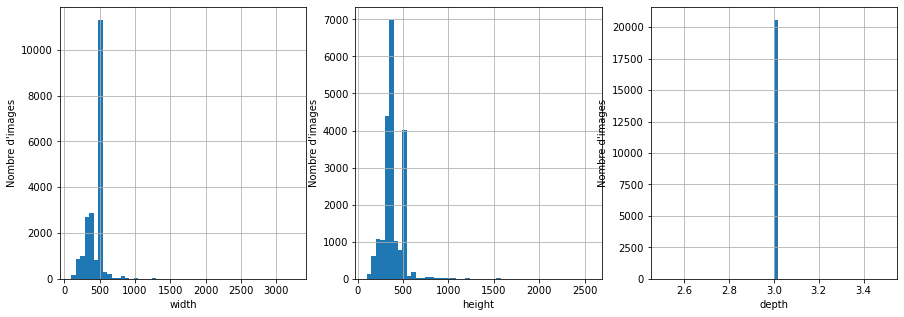

In [12]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15,5))
for i, par in enumerate(['width', 'height', 'depth']) :
    print(f"{par} : Valeur moyenne = {DATA[par].mean()}")
    DATA[par].hist(ax=axs[i], bins=50)
    axs[i].set_xlabel(par)
    axs[i].set_ylabel("Nombre d'images")
plt.show()

La taille des images est assez variable. Les distributions de la largeur et de la hauteur sont similaires ce qui signifie que nous avons des images en format portraits et paysages.  
Toutes les images sont par contre dans le même format RGB avec une profondeur de 3 correspondant à la couleur rouge, vert et bleu.

### exploration des labels

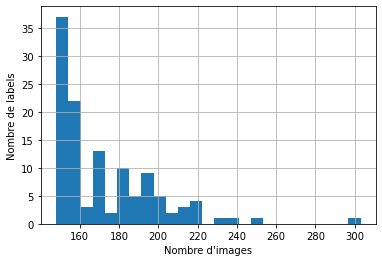

Nombre moyen d'images par label = 172.94117647058823
Nombre median d'images par label = 161.0
Nombre d'images minimum = 148
Nombre d'images maximum = 303


In [11]:
lab_count = DATA.groupby('labels').size().sort_values(ascending=False)
fig, ax = plt.subplots()
lab_count.hist(bins=25, ax=ax)
ax.set_xlabel("Nombre d'images")
ax.set_ylabel("Nombre de labels")
plt.show()
print(f"Nombre moyen d'images par label = {lab_count.mean()}")
print(f"Nombre median d'images par label = {lab_count.median()}")
print(f"Nombre d'images minimum = {lab_count.min()}")
print(f"Nombre d'images maximum = {lab_count.max()}")

On observe que toutes les races de chiens possèdent au minimum 148 images.  
La majorité des races ont entre 148 et 161 images (médiane).  
Certaines races sont très représentées avec plus de 250 images.

Nombre d'images dans les 5 label les plus remplis = 1245, soit 6.05%
Nombre d'images dans les 10 label les plus remplis = 2326, soit 11.30%
Nombre d'images dans les 20 label les plus remplis = 4351, soit 21.14%
Nombre d'images dans les 30 label les plus remplis = 6280, soit 30.52%


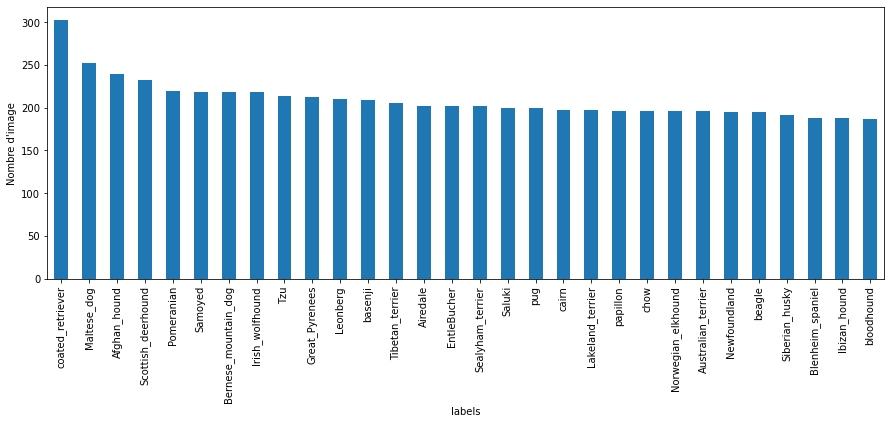

In [12]:
fig, ax = plt.subplots(figsize=(15,5))
lab_count[:30].plot(kind="bar", ax=ax)
ax.set_ylabel("Nombre d'image")
for n in [5,10,20,30] :
    print(f"Nombre d'images dans les {n} label les plus remplis = {lab_count[:n].sum()}, soit {lab_count[:n].sum()/len(DATA)*100:.2f}%")
plt.show()

Afin de diminuer le nombre d'image en mémoire et d'accélérer les codes de développement de la classification, nous conservons 10 ou 20 races de chiens ce qui correspond à environ 10 ou 20% des images

coated_retriever


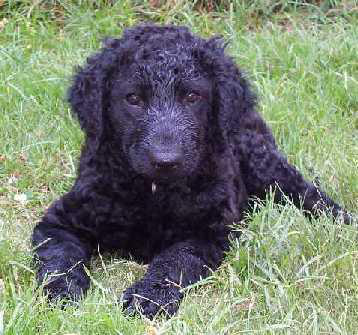

Maltese_dog


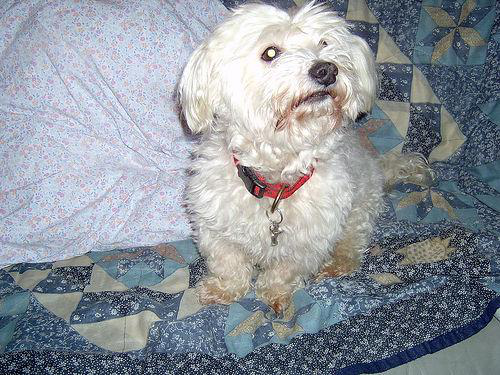

Afghan_hound


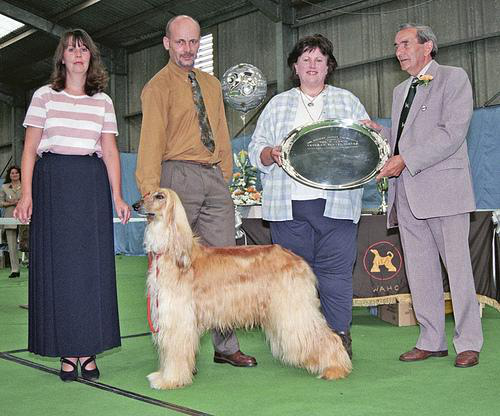

Scottish_deerhound


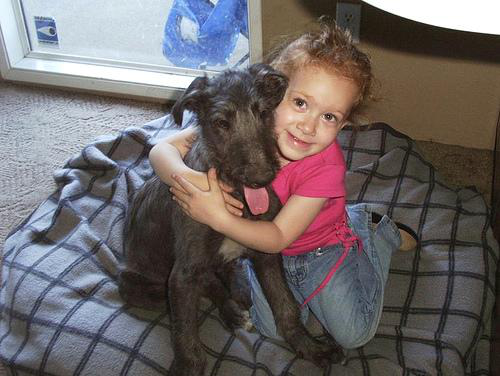

Pomeranian


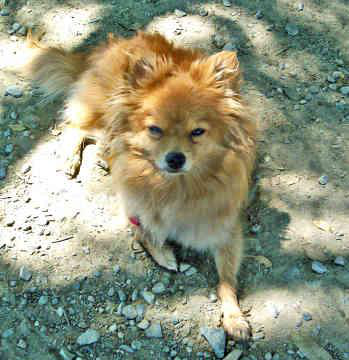

Samoyed


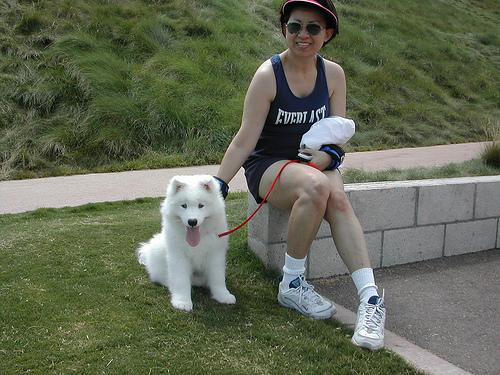

Bernese_mountain_dog


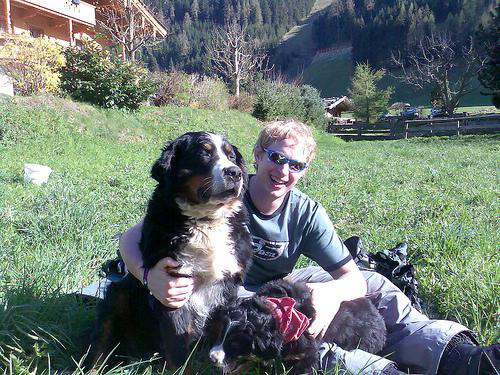

Irish_wolfhound


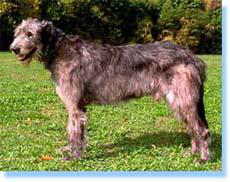

Tzu


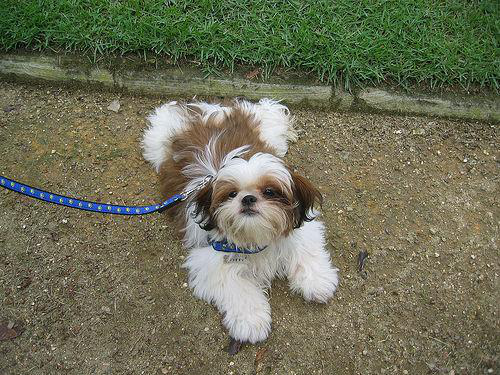

Great_Pyrenees


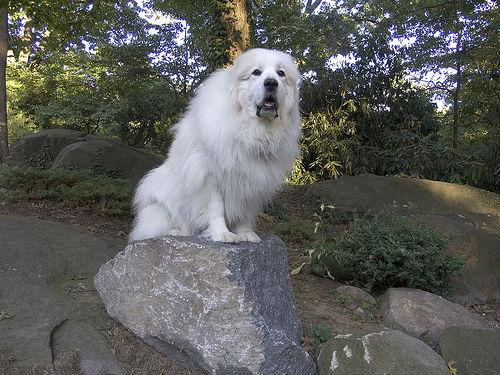

In [13]:
for label in lab_count[:10].index :
    print("="*50)
    print(label)
    print("="*50)
    tmp = DATA[DATA['labels']==label]
    display(tmp.iloc[np.random.randint(len(tmp))]['image'])
del tmp

### utilisation que des 10 labels les plus fréquents
Pour limiter les besoins en ressources de la classification, nous conservons uniquement les 10 races de chiens les plus fréquentes dans une logique de développement.

In [14]:
labels = lab_count[:10].index
print(f"Race de chiens conservées = {labels}")
DATA = DATA[DATA.labels.isin(labels)]
DATA

Race de chiens conservées = Index(['coated_retriever', 'Maltese_dog', 'Afghan_hound', 'Scottish_deerhound',
       'Pomeranian', 'Samoyed', 'Bernese_mountain_dog', 'Irish_wolfhound',
       'Tzu', 'Great_Pyrenees'],
      dtype='object', name='labels')


,path,labels,image,fname
337,Images/n02085936-Maltese_dog/n02085936_10073.jpg,Maltese_dog,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085936_10073
338,Images/n02085936-Maltese_dog/n02085936_10130.jpg,Maltese_dog,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085936_10130
339,Images/n02085936-Maltese_dog/n02085936_10273.jpg,Maltese_dog,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085936_10273
340,Images/n02085936-Maltese_dog/n02085936_10377.jpg,Maltese_dog,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085936_10377
341,Images/n02085936-Maltese_dog/n02085936_10397.jpg,Maltese_dog,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02085936_10397
...,...,...,...,...
18013,Images/n02112018-Pomeranian/n02112018_877.jpg,Pomeranian,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02112018_877
18014,Images/n02112018-Pomeranian/n02112018_9028.jpg,Pomeranian,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02112018_9028
18015,Images/n02112018-Pomeranian/n02112018_904.jpg,Pomeranian,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02112018_904
18016,Images/n02112018-Pomeranian/n02112018_919.jpg,Pomeranian,<PIL.JpegImagePlugin.JpegImageFile image mode=...,n02112018_919


## Resize des images
Puisque dans la plupart des cas les algorithmes de classificiation ont besoin d'entrées avec une taille unique, les images du dataset sont redimmensionnées.    
La taille choisie est 400*400, afin d'obtenir un carré et de ne tenir compte de l'orientation de l'image.

In [15]:
DATA['image'] = DATA['image'].apply(lambda x : x.resize((400,400)))

C:\Users\erwan\AppData\Local\Temp/ipykernel_5624/4219243442.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  DATA['image'] = DATA['image'].apply(lambda x : x.resize((400,400)))


## SIFT
SIFT est une méthode permettant d'identifier des zones d'intérets sur une image et d'extraire un descripteur pour chaque zone.  
Ces descripteurs peuvent ensuite être utilisés en entrée d'un classifieur.

### Conversion en noir et blanc

In [16]:
DATA['image_gray'] = DATA['image'].apply(lambda x: cv2.cvtColor(np.array(x), cv2.COLOR_BGR2GRAY))

C:\Users\erwan\AppData\Local\Temp/ipykernel_7652/2673327239.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  DATA['image_gray'] = DATA['image'].apply(lambda x: cv2.cvtColor(np.array(x), cv2.COLOR_BGR2GRAY))


### Calcul des features SIFT

In [17]:
# create SIFT feature extractor
sift = cv2.xfeatures2d.SIFT_create()

keypoints, descriptors = [], []
for i, img in enumerate(DATA['image']) :
    print(f"{i}/{len(DATA)}", end='\r')
    key, desc =  sift.detectAndCompute(np.array(img), None)
    keypoints.append(key)
    descriptors.append(desc)

In [25]:
DATA['descriptors'] = descriptors
DATA['keypoints'] = keypoints

C:\Users\erwan\AppData\Local\Temp/ipykernel_7652/2685575164.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  DATA['descriptors'] = descriptors
C:\Users\erwan\AppData\Local\Temp/ipykernel_7652/2685575164.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  DATA['keypoints'] = keypoints


### représentation des points d'intérêts

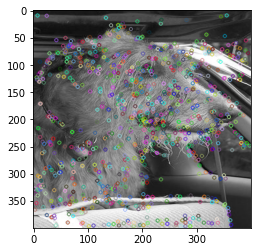

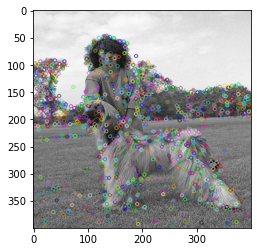

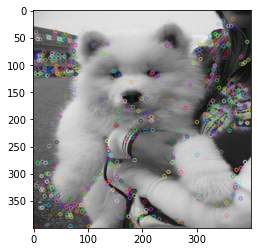

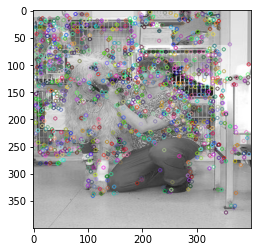

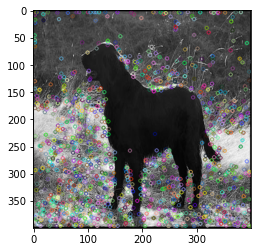

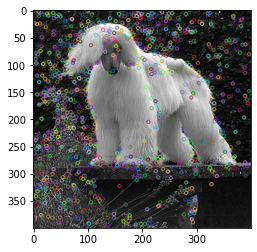

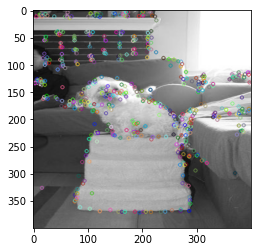

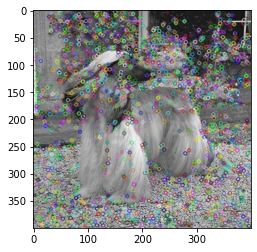

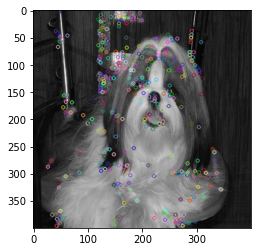

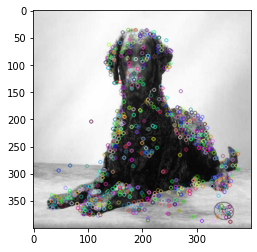

In [26]:
nimg = np.random.randint(low=0, high=len(DATA), size=10)
for n in nimg :
    dat = DATA.iloc[n]
    sift_image = cv2.drawKeypoints(dat['image_gray'], dat['keypoints'], np.array(dat['image']))
    plt.imshow(sift_image)
    plt.show()

On remarque que le nombre de points d'intérêts est variable selon les images. Cela signifie qu'il faut un traitement supplémentaire afin d'utiliser ces descripteurs en entrée d'un modèle (conservation de la taille des inputs).  
On remarque également que les zones d'intérêts ne se trouvent pas forcément sur le chien, mais parfois dans le décor. Ces descripteurs ne semblent pas donc pas être important pour séparer les races de chiens.

## encodage des labels

In [16]:
encoder = LabelEncoder()
encoder.fit(DATA['labels'])
DATA['int_labels'] = encoder.transform(DATA['labels'])
DATA.head()

C:\Users\erwan\AppData\Local\Temp/ipykernel_5624/467006957.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  DATA['int_labels'] = encoder.transform(DATA['labels'])


,path,labels,image,fname,int_labels
337,Images/n02085936-Maltese_dog/n02085936_10073.jpg,Maltese_dog,<PIL.Image.Image image mode=RGB size=400x400 a...,n02085936_10073,4
338,Images/n02085936-Maltese_dog/n02085936_10130.jpg,Maltese_dog,<PIL.Image.Image image mode=RGB size=400x400 a...,n02085936_10130,4
339,Images/n02085936-Maltese_dog/n02085936_10273.jpg,Maltese_dog,<PIL.Image.Image image mode=RGB size=400x400 a...,n02085936_10273,4
340,Images/n02085936-Maltese_dog/n02085936_10377.jpg,Maltese_dog,<PIL.Image.Image image mode=RGB size=400x400 a...,n02085936_10377,4
341,Images/n02085936-Maltese_dog/n02085936_10397.jpg,Maltese_dog,<PIL.Image.Image image mode=RGB size=400x400 a...,n02085936_10397,4


## Echantillonnage de la base de données

### Séparation jeu d'apprentissage et de test

In [17]:
X_train, X_test, y_train, y_test = train_test_split(DATA, DATA['int_labels'], test_size=0.2, random_state=42,
                                                   stratify=DATA['int_labels'])

In [18]:
print(f"Nombre d'images dans le train set = {X_train.shape[0]}")
print(f"Nombre d'images dans le train set = {X_test.shape[0]}")

Nombre d'images dans le train set = 1860
Nombre d'images dans le train set = 466


## Visualisation de l'espace mémoire

In [77]:
import sys

ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']
sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)


[('DATA', 696684),
 ('X_train', 557127),
 ('X_test', 139573),
 ('y_train', 22336),
 ('lab_count', 9277),
 ('f', 8360),
 ('y_test', 5608),
 ('KNeighborsClassifier', 1064),
 ('LabelEncoder', 1064),
 ('MaxPooling2D', 1064),
 ('Conv2D', 896),
 ('Dense', 896),
 ('Flatten', 896),
 ('Sequential', 896),
 ('labels', 712),
 ('members', 192),
 ('autocontrast', 136),
 ('equalize', 136),
 ('train_test_split', 136),
 ('axs', 104),
 ('ImageFilter', 72),
 ('np', 72),
 ('pd', 72),
 ('plt', 72),
 ('fname', 63),
 ('lab', 63),
 ('label', 63),
 ('DIR', 54),
 ('par', 54),
 ('ax', 48),
 ('encoder', 48),
 ('fig', 48),
 ('my_CNN', 48),
 ('tar_images', 48),
 ('i', 28),
 ('n', 28)]

## transformation images
A titre d'exemple, on applique des corrections sur un jeu d'images de taille limitée

In [32]:
img = np.random.randint(low=0, high=len(DATA), size=10)
img

array([1437,  111,  767, 2093, 1821, 1030, 1306, 1028, 1272, 1752])

### correction luminosité
pour corriger la luminosité on applique un étirement sur l'histogramme par une règle de 3.

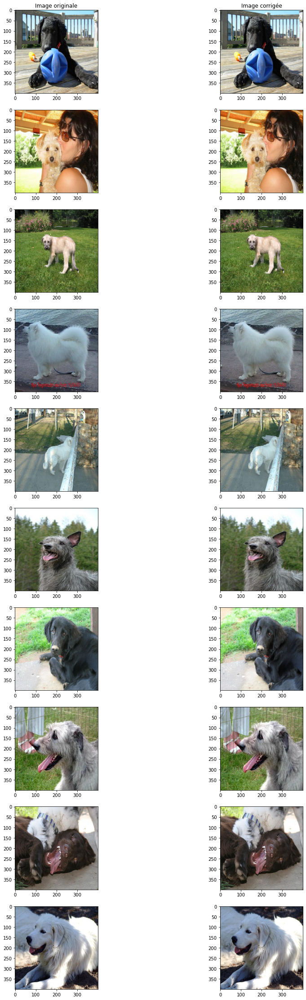

In [33]:
fig, axs = plt.subplots(ncols=2, nrows=len(img), figsize=(15,40))
for i, nimg in enumerate(img) :
    axs[i,0].imshow(DATA.iloc[nimg]['image'])
    axs[i,1].imshow(autocontrast(DATA.iloc[nimg]['image']))
axs[0,0].title.set_text('Image originale')
axs[0,1].title.set_text('Image corrigée')
plt.show()

### egalisation d'histogramme
Pour corriger les différence d'intensité entre le point le plus sombre et le clair.  
La correction permet de normaliser la distribution des couleurs pour que chaque niveau contienne le même nombre de pixel.

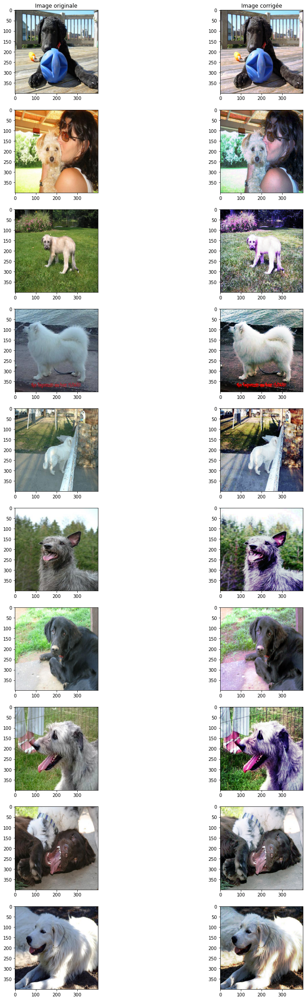

In [34]:
fig, axs = plt.subplots(ncols=2, nrows=len(img), figsize=(15,40))
for i, nimg in enumerate(img) :
    axs[i,0].imshow(DATA.iloc[nimg]['image'])
    axs[i,1].imshow(equalize(DATA.iloc[nimg]['image']))
axs[0,0].title.set_text('Image originale')
axs[0,1].title.set_text('Image corrigée')
plt.show()

### Débruitage
La manière la plus efficace de réduction du bruit aléatoire est l'application d'une fonction gaussienne sur les niveau de couleur.  
L"application d'une gaussienne provoque une image plus flou.

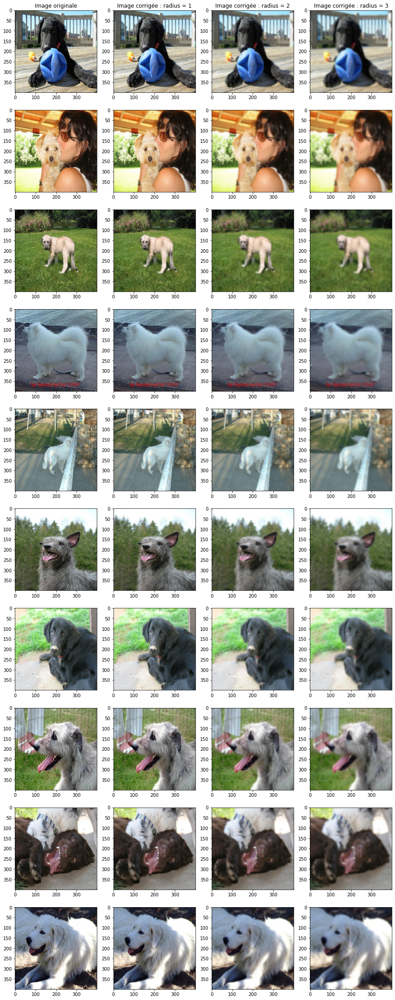

In [35]:
fig, axs = plt.subplots(ncols=4, nrows=len(img), figsize=(15,40))
for i, nimg in enumerate(img) :
    axs[i,0].imshow(DATA.iloc[nimg]['image'])
    for j, rad in enumerate([1,2,3]): 
        axs[i,j+1].imshow(DATA.iloc[nimg]['image'].filter(ImageFilter.GaussianBlur(radius=rad)))
axs[0,0].title.set_text('Image originale')
for j, rad in enumerate([1,2,3]): 
    axs[0,j+1].title.set_text(f'Image corrigée : radius = {rad}')
plt.show()
#DATA['image_nonoise'] = DATA['image'].apply(lambda x : x.filter(ImageFilter.GaussianBlur(radius=0.5)))